First download clipped FES2022 tide data for the pacific. This is about 2.5 GB. (The ocean_tide data is the extrapolated version, but I renamed it so it would
work with the dea functions further on).

In [1]:
!pwd

/home/jovyan/dep-sdb/tides


In [2]:
from pathlib import Path
import requests
import re
import urllib
list_url = "https://dep-public-staging.s3.us-west-2.amazonaws.com/dep_ls_coastlines/raw/tidal_models/fes2022b/tide_data_urls.txt"

for item_url in requests.get(list_url, stream=True).iter_lines(decode_unicode=True):
    local_path = Path(re.sub('^.*(tidal_models.*)$', '\\1', item_url))
    if not local_path.exists():
            local_path.parent.mkdir(parents=True, exist_ok=True)
            urllib.request.urlretrieve(item_url, local_path)
    print(local_path)

tidal_models/fes2022b/load_tide/2n2_fes2022.nc
tidal_models/fes2022b/load_tide/eps2_fes2022.nc
tidal_models/fes2022b/load_tide/j1_fes2022.nc
tidal_models/fes2022b/load_tide/k1_fes2022.nc
tidal_models/fes2022b/load_tide/k2_fes2022.nc
tidal_models/fes2022b/load_tide/l2_fes2022.nc
tidal_models/fes2022b/load_tide/lambda2_fes2022.nc
tidal_models/fes2022b/load_tide/m2_fes2022.nc
tidal_models/fes2022b/load_tide/m3_fes2022.nc
tidal_models/fes2022b/load_tide/m4_fes2022.nc
tidal_models/fes2022b/load_tide/m6_fes2022.nc
tidal_models/fes2022b/load_tide/m8_fes2022.nc
tidal_models/fes2022b/load_tide/mf_fes2022.nc
tidal_models/fes2022b/load_tide/mks2_fes2022.nc
tidal_models/fes2022b/load_tide/mm_fes2022.nc
tidal_models/fes2022b/load_tide/mn4_fes2022.nc
tidal_models/fes2022b/load_tide/ms4_fes2022.nc
tidal_models/fes2022b/load_tide/msf_fes2022.nc
tidal_models/fes2022b/load_tide/msqm_fes2022.nc
tidal_models/fes2022b/load_tide/mtm_fes2022.nc
tidal_models/fes2022b/load_tide/mu2_fes2022.nc
tidal_models/fes2

Perform a sentinel search and load data

In [3]:
import geopandas as gpd
import planetary_computer
import pystac_client
from shapely.geometry import box


# bounds for Samoa
bounds = [-172.8, -13.8, -172.1, -13.37]
aoi = box(*bounds)

catalog = pystac_client.Client.open("https://earth-search.aws.element84.com/v1")
items = catalog.search(
    collections=["sentinel-2-c1-l2a"],
    intersects=aoi,
    # be aware of offset if loading recent data
    datetime="2019",
).item_collection()

In [4]:
from odc.stac import load

def load_items(items):
    data = load(
        items,
        chunks={},
        bbox=bounds,
        groupby="solar_day",
        measurements=[
            "red",
            "green",
            "blue",
            "nir",
            "nir09",
            "swir16",
            "swir22",
            "coastal",
            "rededge1",
            "rededge2",
            "rededge3",
            "scl"
        ]
    )
    
    # nodata, cloud shadow, medium cloud, high cloud
    mask_flags = [1, 3, 8, 9]
    cloud_mask = ~data.scl.isin(mask_flags)
    masked = data.where(cloud_mask).drop_vars("scl")
    return (masked.where(masked != 0) * 0.0001).clip(0, 1)

one_year = load_items(items)
one_year

<xarray.Dataset> Size: 69GB
Dimensions:      (time: 43, y: 4803, x: 7604)
Coordinates:
  * y            (y) float64 38kB 8.522e+06 8.522e+06 ... 8.474e+06 8.474e+06
  * x            (x) float64 61kB 3.051e+05 3.051e+05 ... 3.811e+05 3.811e+05
    spatial_ref  int32 4B 32702
  * time         (time) datetime64[ns] 344B 2019-06-14T21:49:31.045000 ... 20...
Data variables:
    red          (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    green        (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    blue         (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    nir          (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    nir09        (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    swir16       (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    swir22       (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    coastal      (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    rededge1     (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    rededge2     (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    rededge3     (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>

`tidal_stats` gives information about tides in this location. It takes a few minutes but it's informative. However, the stats are based on a single location (by default
the centroid of the data).

Setting tide modelling location from dataset centroid: -172.45, -13.59
Modelling tides using FES2022
Modelling tides using FES2022
                                               tide_model    tide_m
time                    x           y                              
2019-06-14 21:49:31.045 -172.450251 -13.585238    FES2022 -0.560070
2019-06-14 23:49:31.045 -172.450251 -13.585238    FES2022 -0.342281
2019-06-15 01:49:31.045 -172.450251 -13.585238    FES2022  0.166191
2019-06-15 03:49:31.045 -172.450251 -13.585238    FES2022  0.484196
2019-06-15 05:49:31.045 -172.450251 -13.585238    FES2022  0.302384
...                                                   ...       ...
2019-12-31 11:49:31.045 -172.450251 -13.585238    FES2022  0.079760
2019-12-31 13:49:31.045 -172.450251 -13.585238    FES2022 -0.241305
2019-12-31 15:49:31.045 -172.450251 -13.585238    FES2022 -0.355865
2019-12-31 17:49:31.045 -172.450251 -13.585238    FES2022 -0.178833
2019-12-31 19:49:31.045 -172.450251 -13.585238    FES

tidepost_lat        -13.585
tidepost_lon       -172.450
observed_mean_m      -0.095
all_mean_m           -0.001
observed_min_m       -0.675
all_min_m            -0.744
observed_max_m        0.414
all_max_m             0.791
observed_range_m      1.089
all_range_m           1.535
spread                0.709
low_tide_offset       0.045
high_tide_offset      0.246
dtype: float64

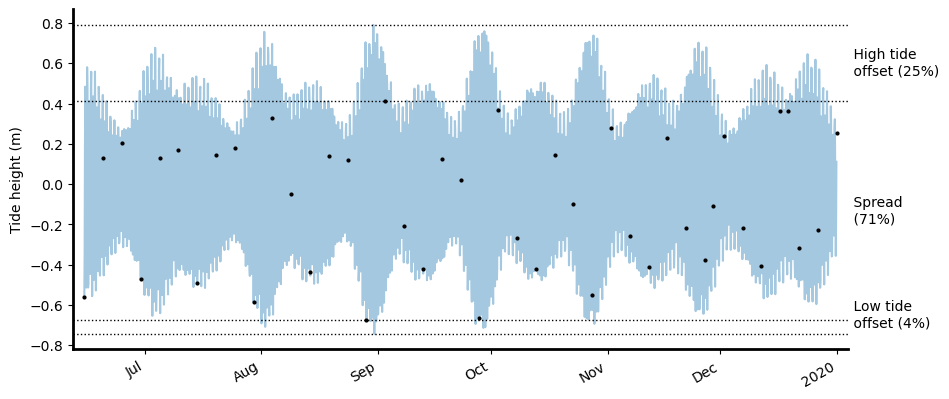

In [5]:
from dea_tools.coastal import tidal_stats

tidal_stats(one_year, directory="tidal_models", model="FES2022")

`tidal_tag` adds a single value for each time step representing the tidal height at the centroid as the variable tide_m. Notice it only has 1 dimension, and is the same length as the time dimension.

In [6]:
from dea_tools.coastal import tidal_tag

one_year = tidal_tag(one_year, directory="tidal_models", model="FES2022")
one_year

Setting tide modelling location from dataset centroid: -172.45, -13.59
Modelling tides using FES2022


<xarray.Dataset> Size: 69GB
Dimensions:      (time: 43, y: 4803, x: 7604)
Coordinates:
  * y            (y) float64 38kB 8.522e+06 8.522e+06 ... 8.474e+06 8.474e+06
  * x            (x) float64 61kB 3.051e+05 3.051e+05 ... 3.811e+05 3.811e+05
    spatial_ref  int32 4B 32702
  * time         (time) datetime64[ns] 344B 2019-06-14T21:49:31.045000 ... 20...
Data variables:
    red          (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    green        (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    blue         (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    nir          (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    nir09        (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    swir16       (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    swir22       (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    coastal      (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    rededge1     (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    rededge2     (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    rededge3     (time, y, x) float32 6GB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    tide_m       (time) float32 172B -0.5601 0.1287 0.2054 ... -0.2257 0.2517

Using that information and the stats above, you could filter on an whole-image basis 

In [7]:
high_tide_cutoff = 0.3
(
    one_year
        .where(one_year.tide_m > high_tide_cutoff, drop=True)
        .median(dim="time")
        .nir09
        .odc.explore()
)

/srv/conda/envs/notebook/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(


Another option is just to take the image with the maximum tide value. 

In [8]:
(
    one_year
        .where(one_year.tide_m == one_year.tide_m.max(), drop=True)
        .squeeze()
        .nir09
        .odc.explore()
)

It may be better to calculate pixelwise tides, use `pixel_tides` for that. To take the maximum tide reading in a set of data, we can use pixel tide with the "calculate_quantiles" argument.
This gives the highest tide value for each pixel among the times in the set.

In [9]:
from dea_tools.coastal import pixel_tides

high_tide_values, _ = pixel_tides(
    one_year, directory="tidal_models", model="FES2022", calculate_quantiles=[1.0]
)
high_tide_values = high_tide_values.squeeze(drop=True).compute()
high_tide_values.odc.explore()

Creating reduced resolution 5000 x 5000 metre tide modelling array
Modelling tides using FES2022 in parallel


100%|██████████| 5/5 [01:53<00:00, 22.75s/it]


Computing tide quantiles
Reprojecting tides into original array


Then, you can get the pixel at each location that had the highest tide.

In [10]:
# Calculate all tide values for each pixel at each timestep
one_year["tide_m"], _ = pixel_tides(one_year, directory="tidal_models", model="FES2022")
highest_tide_in_year = one_year.where(one_year.tide_m == high_tide_values.squeeze(drop=True), drop=True)
highest_tide_in_year

Creating reduced resolution 5000 x 5000 metre tide modelling array
Modelling tides using FES2022 in parallel


100%|██████████| 5/5 [01:54<00:00, 22.89s/it]


Reprojecting tides into original array


<xarray.Dataset> Size: 2GB
Dimensions:      (time: 1, y: 4803, x: 7604)
Coordinates:
  * y            (y) float64 38kB 8.522e+06 8.522e+06 ... 8.474e+06 8.474e+06
  * x            (x) float64 61kB 3.051e+05 3.051e+05 ... 3.811e+05 3.811e+05
    spatial_ref  int32 4B 32702
  * time         (time) datetime64[ns] 8B 2019-09-02T21:49:27.959000
    tide_model   <U7 28B 'FES2022'
Data variables:
    red          (time, y, x) float32 146MB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    green        (time, y, x) float32 146MB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    blue         (time, y, x) float32 146MB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    nir          (time, y, x) float32 146MB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    nir09        (time, y, x) float32 146MB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    swir16       (time, y, x) float32 146MB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    swir22       (time, y, x) float32 146MB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    coastal      (time, y, x) float32 146MB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    rededge1     (time, y, x) float32 146MB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    rededge2     (time, y, x) float32 146MB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    rededge3     (time, y, x) float32 146MB dask.array<chunksize=(1, 4803, 7604), meta=np.ndarray>
    tide_m       (time, y, x) float32 146MB 0.4259 0.4259 ... 0.4227 0.4226

In [11]:
highest_tide_in_year.squeeze(drop=True).nir09.odc.explore()

Looks like all the high tide values fall in the same image as above!

There are a couple of issues with this approach. First, you only get the highest tide pixels - if they are masked or have undetected clouds, you get artifacts. The second is that it only gives the highest tide among the values in the set. If your images don't actually capture high or near-high tides, you won't be able to tell.

So, you could alternatively calculate a time series of tide values for each pixel and then take the upper part of the range.
(Here we use a quantile value below 1 because we are likely to not have the highest time in the image dataset.)

In [12]:
import pandas as pd 
# calculate the 75th percentile for a all tides in 2019 at 19h frequency for each pixel 
high_tide_within_year, _ = pixel_tides(one_year, 
    times=pd.date_range(start="2019", end="2020", freq="19h"),
    directory="tidal_models", model="FES2022",
    dask_compute=False,
    calculate_quantiles=[0.75]
)
high_tide_within_year = high_tide_within_year.squeeze(drop=True)

Creating reduced resolution 5000 x 5000 metre tide modelling array
Modelling tides using FES2022 in parallel


100%|██████████| 5/5 [01:57<00:00, 23.46s/it]

Computing tide quantiles
Reprojecting tides into original array


Then you can filter the pixels by the absolute cutoff.

In [14]:
one_year_high_tide_pixelwise = (
    one_year
        .where(one_year.tide_m > high_tide_within_year)
        .median(dim="time")
)

In [15]:
one_year_high_tide_pixelwise.nir09.odc.explore()

In [16]:
one_year_high_tide_pixelwise.nir09.rio.to_raster("oyhtpwnir.tif", driver="COG")